In [37]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

Arnold Cat Map

In [43]:
img=cv2.imread("E:/BG/lena.jpeg",0)
img=cv2.resize(img, (256, 256))

In [44]:
def coord_trans(x,y,N):
    x1=(x+y)%N
    y1=(x+2*y)%N
    return x1,y1

In [45]:
def apply_acm(img):
    N = img.shape[0]
    cimg = np.zeros_like(img)
    for x in range(N):
        for y in range(N):
            x1 = (x + y) % N
            y1 = (x + 2*y) % N
            
            cimg[x, y] = img[x1, y1]      
    return cimg

In [46]:
imgList=[]
iterations=250
img=img.copy()
imgList.append(img)
for i in range(iterations-1):
    acm_img=apply_acm(img)
    imgList.append(acm_img)
    img=acm_img

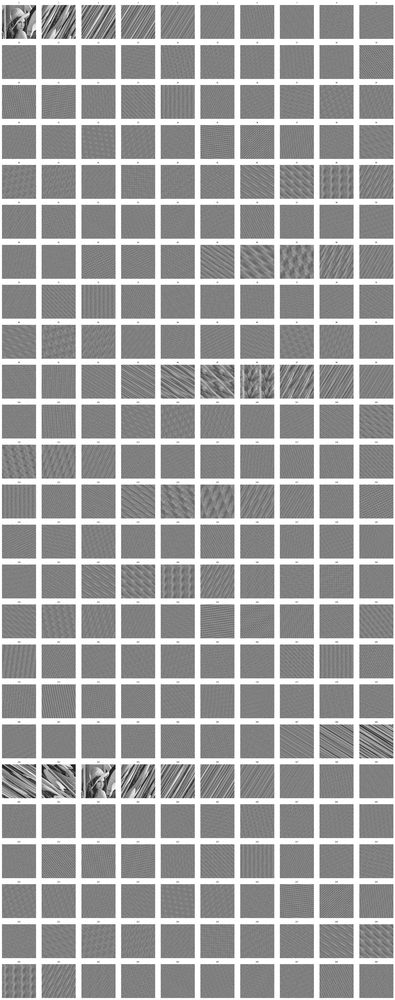

In [47]:
import math
for i in range(len(imgList)):
    imgList[i] = np.clip(imgList[i], 0, 255)
    imgList[i] = imgList[i].astype(np.uint8)
n = len(imgList)
cols = 10
rows = math.ceil(n / cols)

plt.figure(figsize=(20, rows*2))

for i in range(n):
    plt.subplot(rows, cols, i+1)
    plt.imshow(imgList[i], cmap='gray')
    plt.title(f"{i}", fontsize=6)
    plt.axis('off')

plt.tight_layout()
plt.show()